Load packages.

In [ ]:
import os
import tensorflow as tf

import IPython.display as display


import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

from tqdm import tqdm

Helper functions to process and show the images.

In [ ]:
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim
    new_shape = tf.cast(shape * scale, tf.int32)
    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()
    plt.clf()
    plt.close()

def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

Setup pre-trained model and define helper functions to extract content & style models as well as compute gram matrix.

In [ ]:
content_layers = ['block5_conv2']
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

def extract_vgg_model(layer_names):
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    model = tf.keras.Model([vgg.input], outputs)
    return model

def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result/(num_locations)

The function to blend arbitary two images by using gradient descent and pre-trained VGG model.

In [ ]:
def blend_two_images(content_img_path, style_img_path, content_weight, style_weight, epoch, show_every=1000, seed=None, path=None, fname=None):
    # Set Seed
    if seed is not None:
        tf.random.set_seed(seed)

    # Load content and style images
    content_img = load_img(content_img_path)
    imshow(content_img, title = "Content Image")
    style_img = load_img(style_img_path)
    imshow(style_img, title = "Style Image")

    # Extract content and style models
    content_model = extract_vgg_model(content_layers)
    style_model = extract_vgg_model(style_layers)

    # Compute content and style targets
    content_targets = [x / 255 for x in content_model(tf.keras.applications.vgg19.preprocess_input(content_img * 255.0))]
    style_targets = [gram_matrix(x) / 255**2 for x in style_model(tf.keras.applications.vgg19.preprocess_input(style_img * 255.0))]
    # Initialize output image
    output_img = tf.Variable(content_img)
    #output_img = tf.Variable(style_img)
    #output_img = tf.Variable(tf.random.normal(tf.shape(content_img), dtype=tf.float32)) #random init

    # Initialize optimizer
    opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
    loss_arr = []

    # Optimize the output image
    for i in tqdm(range(epoch)):
        with tf.GradientTape() as tape:
            output_img_processed = tf.keras.applications.vgg19.preprocess_input(output_img * 255.0)
            content_outputs = [x / 255 for x in content_model(output_img_processed)]
            style_outputs = [gram_matrix(x) / 255**2 for x in style_model(output_img_processed)]
            loss = content_weight * tf.add_n([tf.reduce_mean((x - y)**2) for x,y in zip(content_outputs, content_targets)]) / num_content_layers + \
                  style_weight * tf.add_n([tf.reduce_mean((x - y)**2) for x,y in zip(style_outputs, style_targets)]) / num_style_layers
            loss_arr.append((loss.numpy() / 1 / (content_weight + style_weight)) ** 0.5)
        grad = tape.gradient(loss, output_img)
        opt.apply_gradients([(grad, output_img)])
        output_img.assign(clip_0_1(output_img))

        if i % show_every == 0 and i > 0:
            imshow(output_img, f"Blended Image\nEpoch = {i + 1}, Loss = {round(loss_arr[-1], 3)}")
            if path is not None:
                tensor_to_image(output_img).save(path + blended.replace(".png", "") + "_epoch=" + str(i) + ".png")
    
    # Return the blended image
    return output_img, loss_arr

Pick two images and blend them.

In [ ]:
from google.colab import drive
drive._mount('/content/drive/')

Mounted at /content/drive/


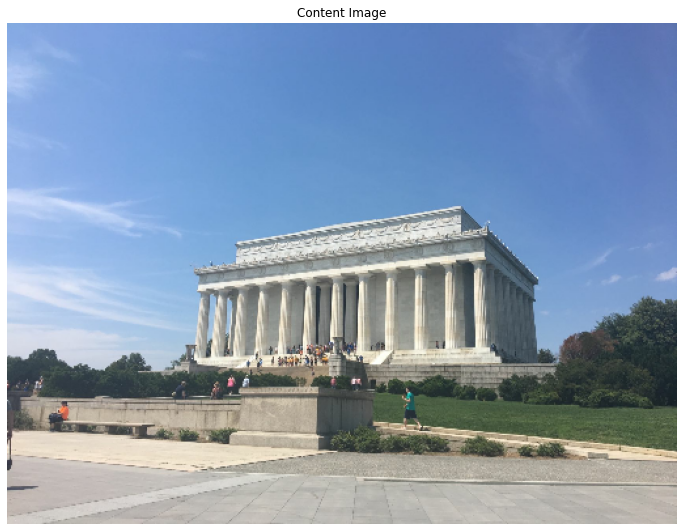

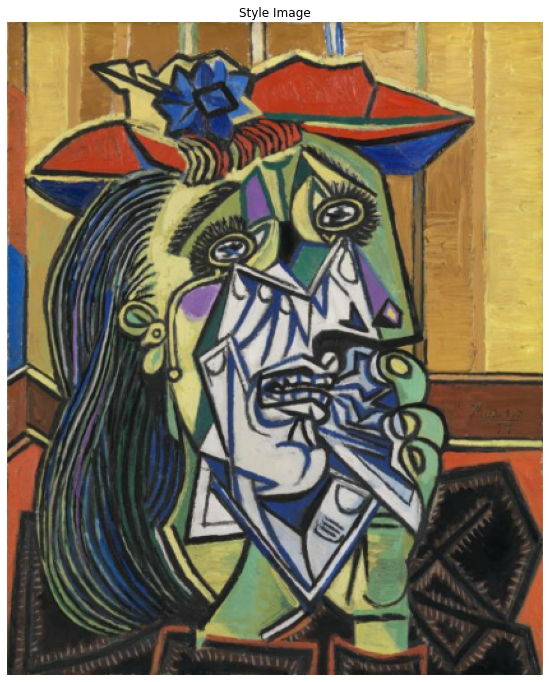

 10%|█         | 1000/10000 [01:59<17:43,  8.46it/s]

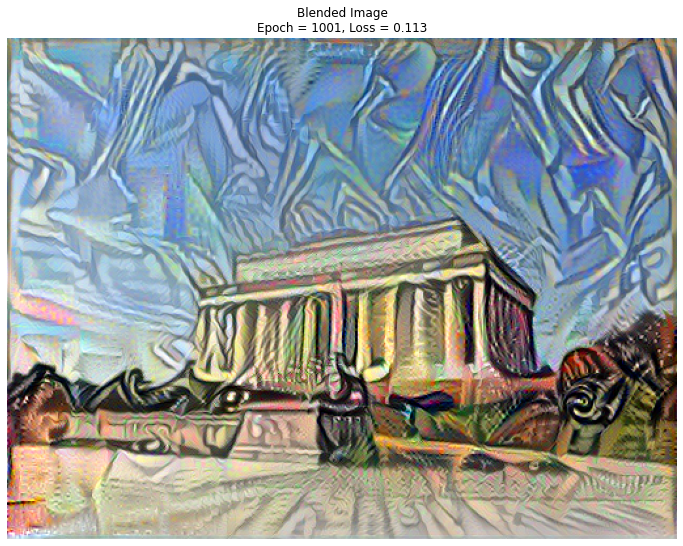

 20%|██        | 2000/10000 [03:57<16:00,  8.33it/s]

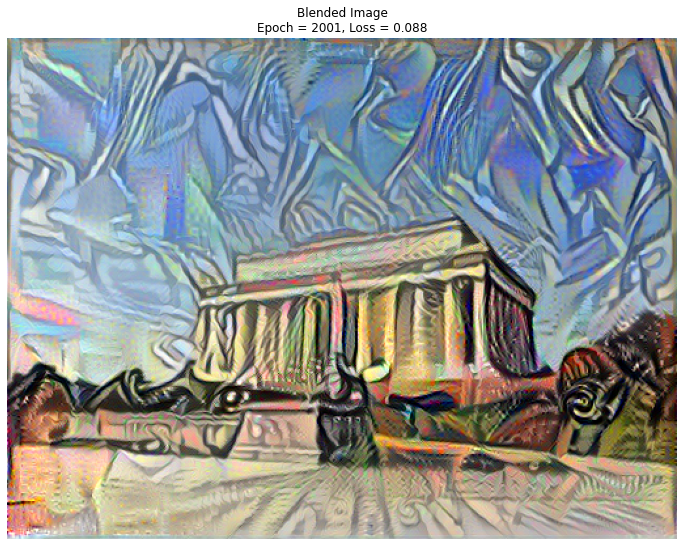

 30%|███       | 3000/10000 [05:55<13:38,  8.55it/s]

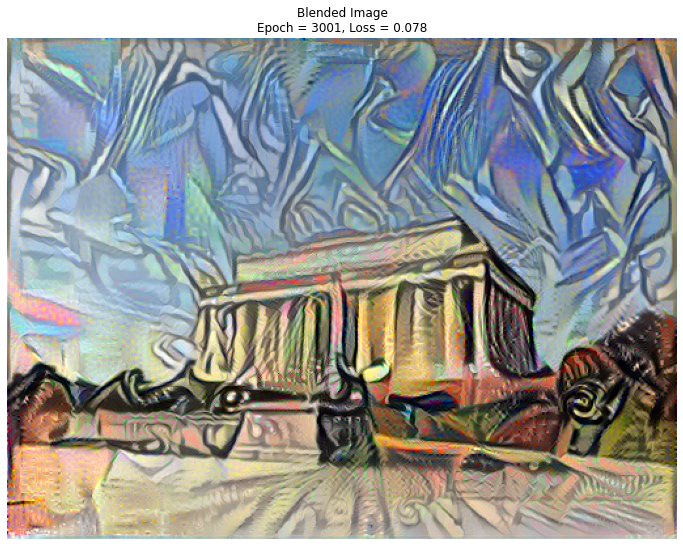

 40%|████      | 4000/10000 [07:53<11:41,  8.56it/s]

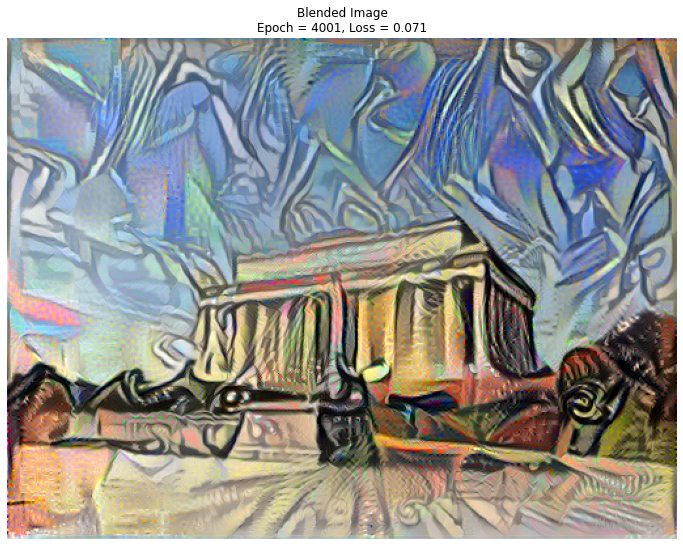

 50%|█████     | 5000/10000 [09:52<09:53,  8.42it/s]

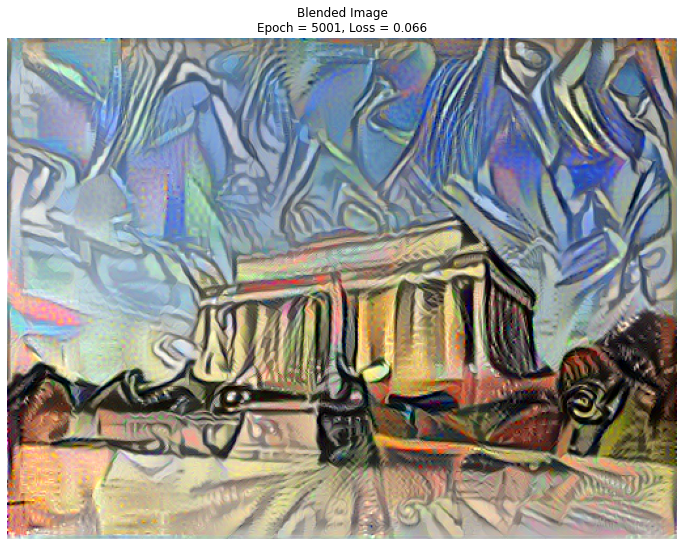

 60%|██████    | 6000/10000 [11:50<07:49,  8.51it/s]

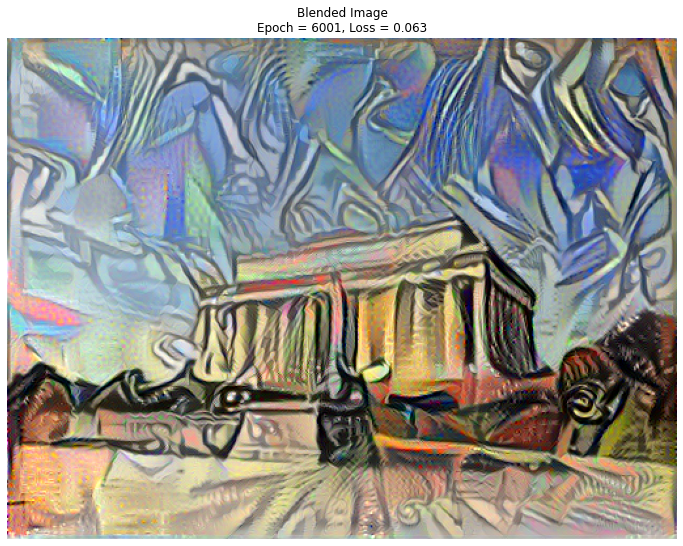

 70%|███████   | 7000/10000 [13:48<05:59,  8.35it/s]

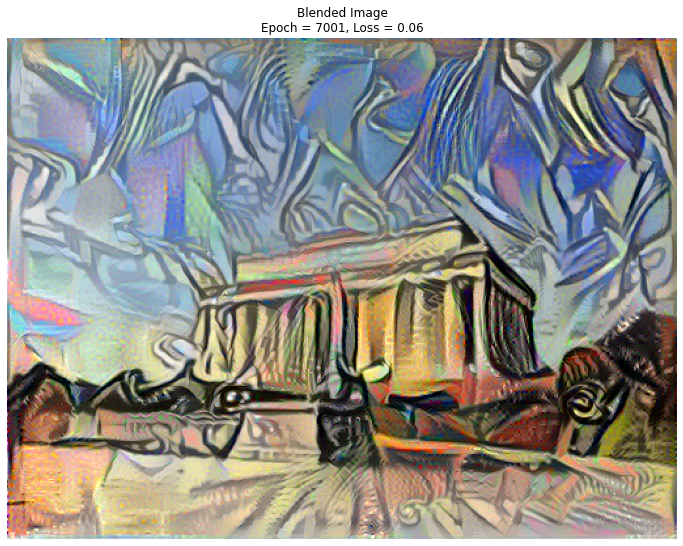

 80%|████████  | 8000/10000 [15:48<03:58,  8.38it/s]

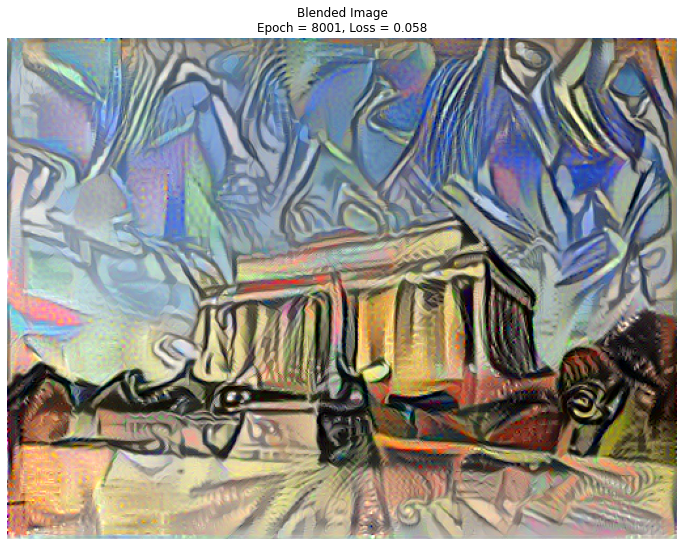

 90%|█████████ | 9000/10000 [17:49<02:00,  8.31it/s]

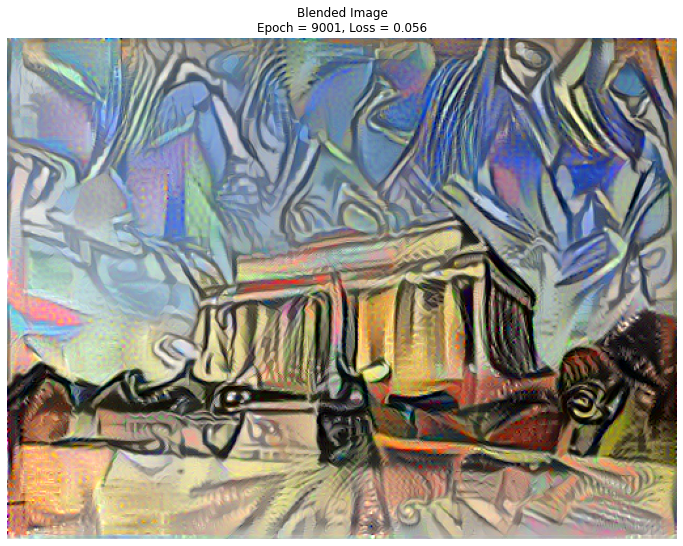

100%|██████████| 10000/10000 [19:50<00:00,  8.40it/s]


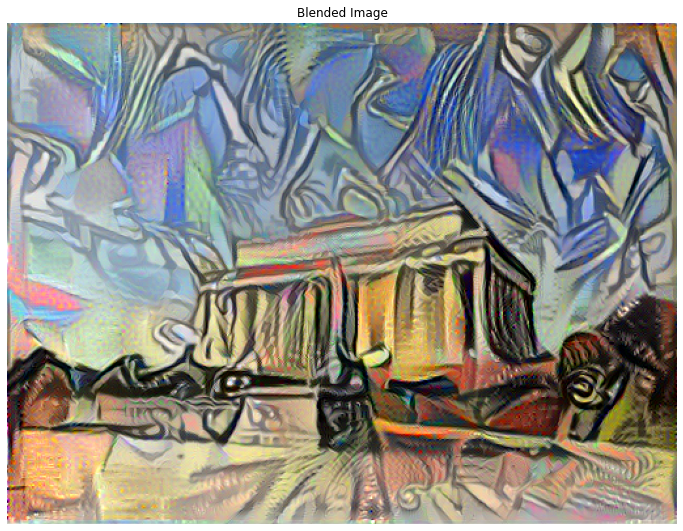

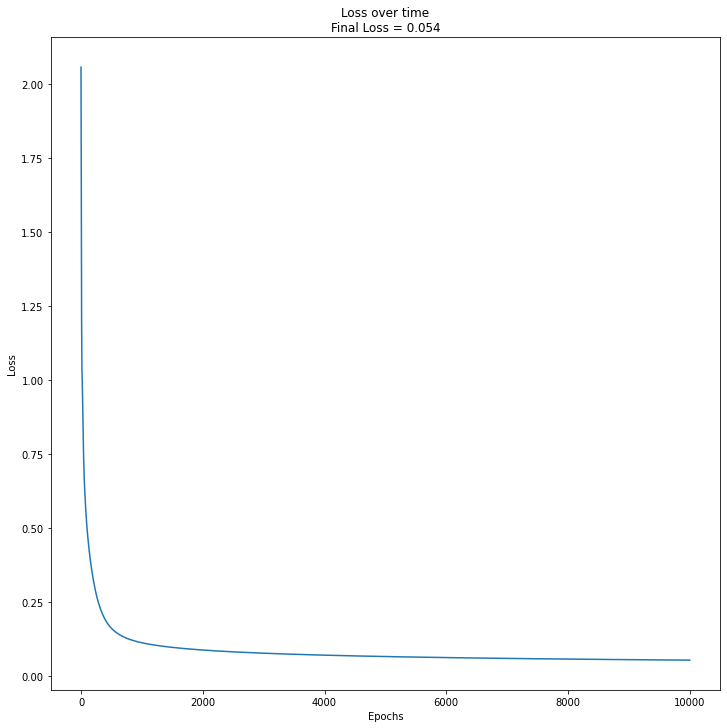

In [ ]:
drive_path_read = "drive/MyDrive/GR5242/Project/Images/"
drive_path_write = drive_path_read #+ "Deliverables/"
content_img = "Washington.jpeg"
style_img = "weeping.jpeg"
content_path = drive_path_read + content_img #tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
style_path = drive_path_read + style_img #tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

content_w = 1e0
style_w = 1e3
seed = 2021

blended = "content_" + content_img.split(".")[0] + "_" + style_img.split(".")[0] + "_content=" + str(content_w) + "_style=" + str(style_w) + "_seed=" + str(seed) + ".png"

blended_img, loss_arr = blend_two_images(content_img_path = content_path, style_img_path = style_path, 
                                         content_weight = content_w, style_weight = style_w, epoch=10000,
                                         path=None, fname=blended)
imshow(blended_img, "Blended Image")
plt.plot(loss_arr)
plt.title(f"Loss over time\nFinal Loss = {round(loss_arr[-1], 3)}")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.savefig(drive_path_write + "Loss_" + blended)
plt.show()
tensor_to_image(blended_img).save(blended)
tensor_to_image(blended_img).save(drive_path_write + blended)